In [18]:
import numpy as np
import os 
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import re
import mne 
from mne.viz import plot_alignment, snapshot_brain_montage
from scipy.stats import sem
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import seaborn as sns
import pickle
from scipy import signal, stats

# Load data

In [2]:
df = pd.read_csv("data\\TRF\\all_patients_TRF_broadband.csv")

## Figure Top left pannel

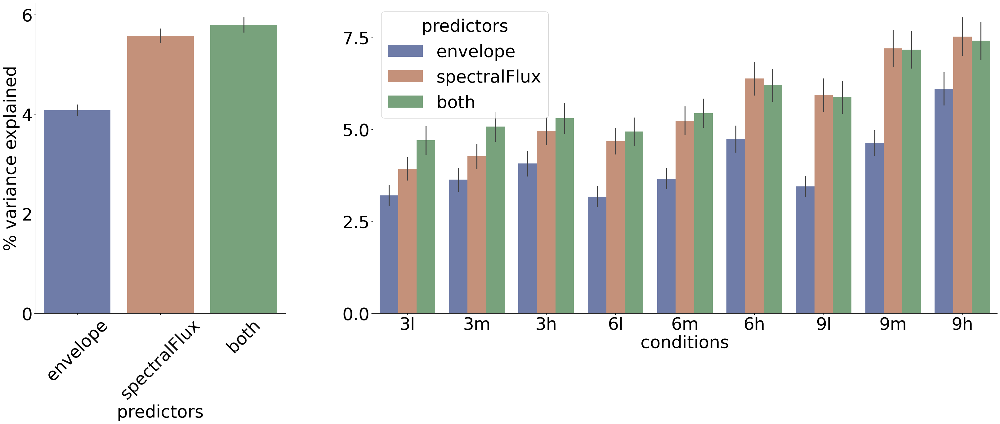

In [3]:
plt.rcParams.update({'font.size':40})

fig1,(ax,ax1) = plt.subplots(1,2,width_ratios=[1,2.5],figsize=(40,13))
sns.barplot(data=df,x='predictors', y= '% variance explained', hue= 'predictors',errorbar='se', palette='dark', alpha=0.6,ax=ax)
sns.barplot(data=df, x='conditions', y= '% variance explained', hue= 'predictors',errorbar='se', palette='dark', alpha=0.6, ax=ax1)
ax.spines[['right', 'top']].set_visible(False)
ax1.spines[['right', 'top']].set_visible(False)
ax1.set_ylabel('');
ax.yaxis.set_major_locator(plt.MaxNLocator(4))
ax1.yaxis.set_major_locator(plt.MaxNLocator(4))
ax.tick_params(axis='x', labelrotation=45)

#fig1.savefig( "figure6topleft.png",  dpi=300, format=None, metadata=None,facecolor='white', edgecolor='white' , bbox_inches='tight')

In [5]:
# retrieve data per predictor
# get good indexes
gginds = df.loc[df['predictors']=='envelope'].groupby('chanels')['% variance explained'].mean().index
# get good contact localisations
gglocs = [df.loc[df['chanels']==i][['x','y','z']].values[0] for i in gginds]
gglocs = np.vstack(gglocs)

# get data from model with both predictors
bothdat = df.loc[df['predictors']=='both'].groupby('chanels')['% variance explained'].mean().values
# both minus spectral flux
sfdat = df.loc[df['predictors']=='spectralFlux'].groupby('chanels')['% variance explained'].mean().values
sfdat = bothdat-sfdat
# both minus envelope
envdat = df.loc[df['predictors']=='envelope'].groupby('chanels')['% variance explained'].mean().values
envdat = bothdat-envdat


In [6]:
# format properly
final_tobrain1 = pd.DataFrame(np.asarray([gginds,gglocs[:,0],gglocs[:,1],gglocs[:,2]
                            ,bothdat,envdat,sfdat]).T,
                             columns=['normative_name','x','y','z','both','bothminusenv','bothminussf'])


Using notebook 3d backend.

Channel types::	seeg: 347


C:\Users\Jeremy\anaconda3\lib\site-packages\matplotlib\collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_63968\4255469157.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


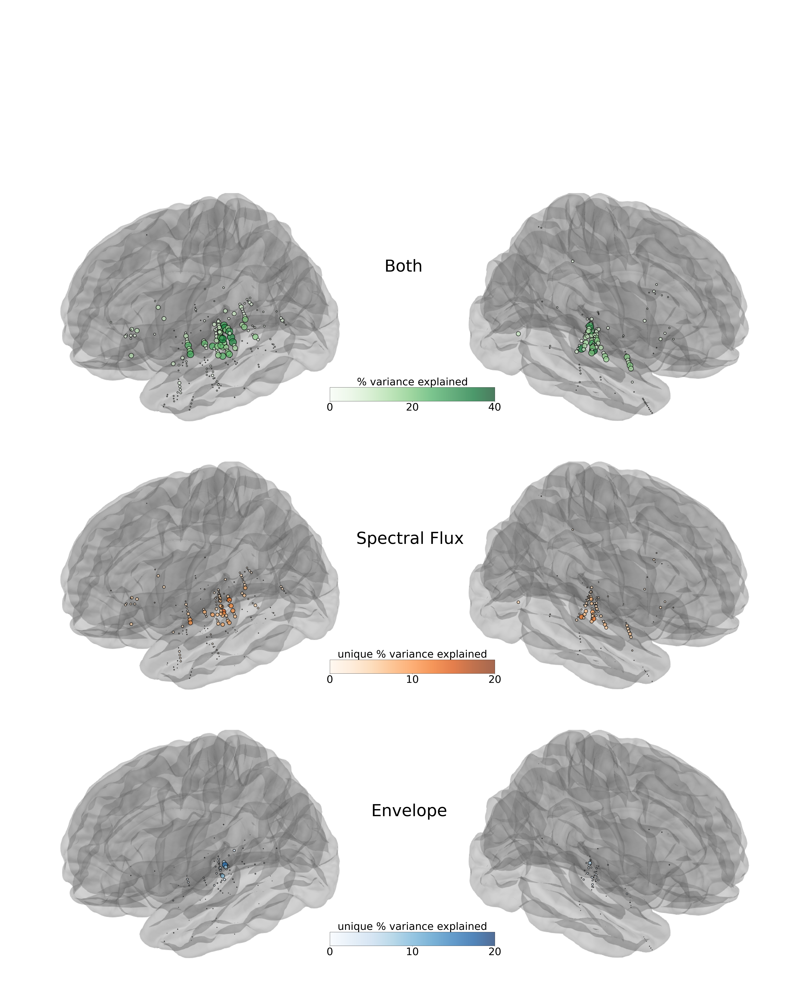

In [7]:
for i in ('x','y','z','both','bothminussf','bothminusenv'):
    final_tobrain1[i] = final_tobrain1[i].astype(float)
datas_to_plot = [final_tobrain1["both"].values,final_tobrain1["bothminusenv"].values,final_tobrain1["bothminussf"].values]
ch_names = final_tobrain1['normative_name'].values
loc = final_tobrain1[['x','y','z']].values
# Declare montage
ch_pos = dict(zip(ch_names, loc))
montage = mne.channels.make_dig_montage(ch_pos=ch_pos, coord_frame='head')
info_ = mne.create_info(list(ch_names), 1000., ch_types='seeg').set_montage(montage)


mne.viz.set_3d_backend("notebook")
fig = mne.viz.create_3d_figure(size=(900, 600), bgcolor='white', scene=True)
subjects_dir = "data\\anatomy\\anatomy2\\"
trans =  mne.read_trans(subjects_dir + '\\fsaverage\\fsaverage-trans.fif')
surfaces = {'brain': 1}

fig =plot_alignment(info=info_,trans=trans,subject='fsaverage',subjects_dir=subjects_dir,
                 surfaces=dict(pial=0.4),seeg=True, interaction='terrain',coord_frame='mri',fig=fig)

mne.viz.set_3d_view(fig,azimuth=-180, elevation=-70,distance = 0.32)
xy, im = snapshot_brain_montage(fig, montage)
xy_pts1 = np.vstack([xy[ch] for ch in info_['ch_names']])

mne.viz.set_3d_view(fig,azimuth=180, elevation=70,distance = 0.32)
xy,im2 = snapshot_brain_montage(fig, montage)
xy_pts2 = np.vstack([xy[ch] for ch in info_['ch_names']])


images = [im2,im,im2,im,im2,im]
idxs = [0,0,1,1,2,2]
cmaaps = ['Greens','Greens','Oranges','Oranges', 'Blues','Blues']
fig2, axs = plt.subplots(3,2,figsize=(50, 50))

vmins = [0,0,0,0,0,0]
vmaxs = [40,40,20,20,20,20]


ms = []

for i,(ax,image,idx,cmaap,vmin,vmax) in enumerate(zip(axs.ravel(),images,idxs,cmaaps,vmins,vmaxs)):
    
    
    #vmin=-1; vmax=12

    if (i % 2) == 0:
        ax.imshow(image, aspect='auto') 
        mask = loc[:, 0] < 0 # Data for electrodes in left hemisphere are set to np.nan
        sizes = datas_to_plot[idx][mask]
        sizes=sizes*35
        m = ax.scatter(*xy_pts2[mask].T, c=datas_to_plot[idx][mask], s=sizes, cmap=cmaap, linewidths=2.6, edgecolors='k', alpha=.7, vmin=vmin, vmax=vmax) 
    else:
        ax.imshow(image, aspect='auto')
        mask = loc[:, 0] >0 # Data for electrodes in left hemisphere are set to np.nan
        sizes = datas_to_plot[idx][mask] 
        sizes=sizes*35

        m = ax.scatter(*xy_pts1[mask].T, c=datas_to_plot[idx][mask], s = sizes,cmap=cmaap, linewidths=2.6, edgecolors='k', alpha=.7, vmin=vmin, vmax=vmax) 
        ms.append(m)
    ax.set_axis_off()

cax = fig2.add_axes([0.41, 0.67, 0.2, 0.55])
cax.set_axis_off()
cbar = plt.colorbar(ms[0], ax=cax, orientation='horizontal',aspect=12, pad=0)
cbar.ax.tick_params(labelsize=45)
cbar.ax.set_title('% variance explained',fontsize=45);
cax.text(0.33,0.3,'Both',fontsize=72)
cbar.set_ticks([0.,  20, 40])


cax2 = fig2.add_axes([0.41, 0.34, 0.2, 0.55])
cax2.set_axis_off()
cax2.text(0.16,0.3,'Spectral Flux',fontsize=72)

cbar2 = plt.colorbar(ms[1], ax=cax2, orientation='horizontal',aspect=12, pad=0)
cbar2.ax.tick_params(labelsize=45)
cbar2.set_ticks([0.,  10, 20])

cbar2.ax.set_title('unique % variance explained',fontsize=45);

cax3 = fig2.add_axes([0.41, 0.01, 0.2, 0.55])
cax3.set_axis_off()
cax3.text(0.25,0.3,'Envelope',fontsize=72)
cbar3 = plt.colorbar(ms[2], ax=cax3, orientation='horizontal',aspect=12, pad=0)
cbar3.set_ticks([0.,  10, 20])

cbar3.ax.tick_params(labelsize=45)
cbar3.ax.set_title('unique % variance explained',fontsize=45);
#tick_locator = ticker.MaxNLocator(nbins=nbins)
#cbar3.locator = tick_locator
#cbar3.update_ticks()
plt.tight_layout()
plt.subplots_adjust(hspace=0)


#fig2.savefig("figure6middleleft.png",  dpi=300, format=None, metadata=None,
# bbox_inches=None, pad_inches=0.1,  facecolor='white', edgecolor='white' )


In [ ]:
#Load TRF kernels

In [13]:
with open('data\\TRF\\all_patients_TRF_kernels_broadband.pickle', 'rb') as handle:
    kernelbroadband = pickle.load(handle)

In [20]:
allTRFenv = kernelbroadband['kernel_envelope']
allTRFsf = kernelbroadband['kernel_spectralFlux']

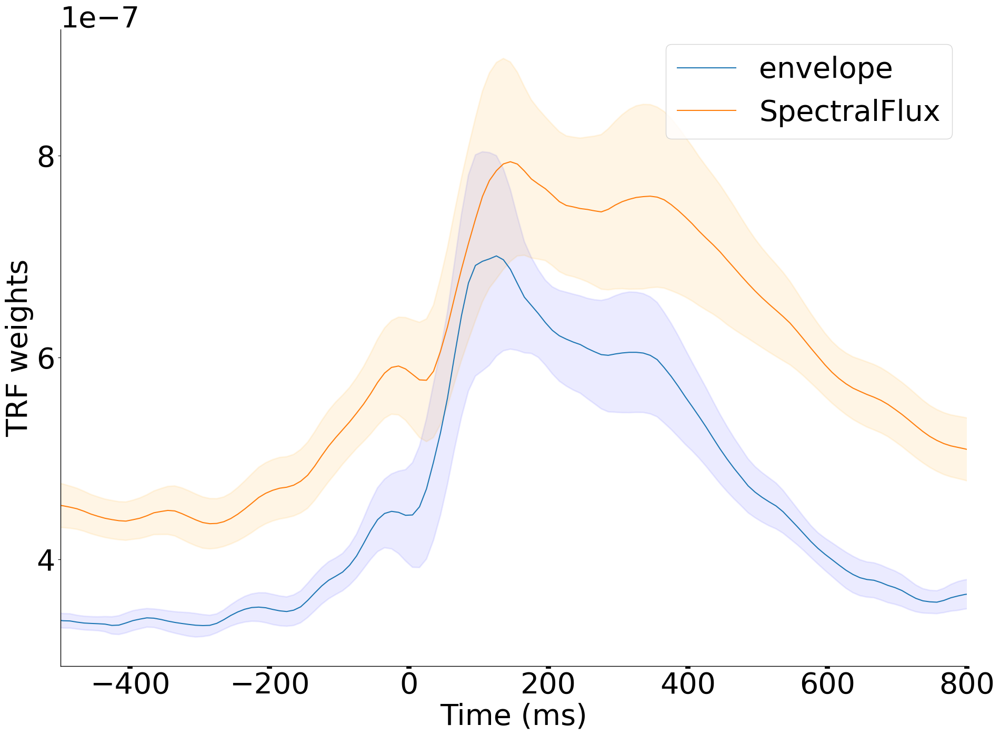

In [21]:
plt.rcParams.update({'axes.linewidth':1})


tidx = np.where(np.logical_and(np.linspace(-2000,2000,400)>=-1000, np.linspace(-2000,2000,400)<=1000))[0]
fig,ax = plt.subplots(1,1, figsize=(20,15))

time = np.linspace(-2000,2000,400)[tidx]
envdat = np.mean(np.mean(allTRFenv,0),0)[tidx]
yerr0 = envdat - stats.sem(np.mean(np.asarray(allTRFenv),0))[tidx]
yerr1 = envdat +  stats.sem(np.mean(np.asarray(allTRFenv),0))[tidx]                 #          np.std(np.asarray(allTRFsf[num])[:,tidx])

sfdat = np.mean(np.mean(allTRFsf,0),0)[tidx]
yerr2 = sfdat - stats.sem(np.mean(np.asarray(allTRFsf),0))[tidx]
yerr3 = sfdat +  stats.sem(np.mean(np.asarray(allTRFsf),0))[tidx]                 #          np.std(np.asarray(allTRFsf[num])[:,tidx])


ax.plot(time,envdat,label='envelope')
ax.fill_between(time, yerr0, yerr1, color='blue',alpha=0.08, linewidth=2)
ax.plot(time,sfdat,label='SpectralFlux')
ax.fill_between(time, yerr2, yerr3, color='orange',alpha=0.1, linewidth=2)

ax.xaxis.set_tick_params(width=7)
ax.spines[['right','top']].set_visible(False)
ax.set_xlabel('Time (ms)')
ax.set_ylabel('TRF weights')
ax.set_xlim(-500,800);

ax.yaxis.set_major_locator(plt.MaxNLocator(4))

ax.legend();
plt.tight_layout()

#fig.savefig("figure6bottomleftfinal.png",  dpi=300, format=None, metadata=None,
 #bbox_inches=None, pad_inches=0.1,  facecolor='white', edgecolor='white' )


# HFa data

In [22]:
df2 = pd.read_csv("data\\TRF\\all_patients_TRF_HFa.csv")

## Figure Top left pannel

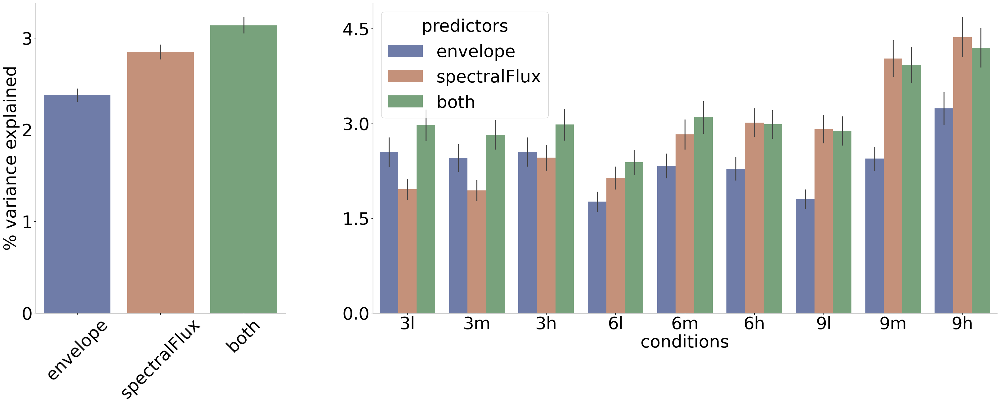

In [23]:
fig3,(ax,ax1) = plt.subplots(1,2,width_ratios=[1,2.5],figsize=(40,13))
plt.rcParams.update({'font.size':40})

sns.barplot(data=df2,x='predictors', y= '% variance explained', hue= 'predictors',errorbar='se', palette='dark', alpha=0.6,ax=ax)
sns.barplot(data=df2, x='conditions', y= '% variance explained', hue= 'predictors',errorbar='se', palette='dark', alpha=0.6, ax=ax1)



ax.spines[['right', 'top']].set_visible(False)
ax1.spines[['right', 'top']].set_visible(False)
ax1.set_ylabel('');
ax.yaxis.set_major_locator(plt.MaxNLocator(4))
ax1.yaxis.set_major_locator(plt.MaxNLocator(4))
ax.tick_params(axis='x', labelrotation=45)

ax.set_xlabel('');

#fig3.savefig( "figure6topright.png",  dpi=300, format=None, metadata=None,facecolor='white', edgecolor='white' , bbox_inches='tight')

In [24]:
# retrieve data per predictor
# get good indexes
gginds = df2.loc[df2['predictors']=='envelope'].groupby('chanels')['% variance explained'].mean().index
# get good contact localisations
gglocs = [df2.loc[df2['chanels']==i][['x','y','z']].values[0] for i in gginds]
gglocs = np.vstack(gglocs)

# get data from model with both predictors
bothdat = df2.loc[df2['predictors']=='both'].groupby('chanels')['% variance explained'].mean().values
# both minus spectral flux
sfdat = df2.loc[df2['predictors']=='spectralFlux'].groupby('chanels')['% variance explained'].mean().values
sfdat = bothdat-sfdat
# both minus envelope
envdat = df2.loc[df2['predictors']=='envelope'].groupby('chanels')['% variance explained'].mean().values
envdat = bothdat-envdat


In [25]:
# format properly
final_tobrain2 = pd.DataFrame(np.asarray([gginds,gglocs[:,0],gglocs[:,1],gglocs[:,2]
                            ,bothdat,envdat,sfdat]).T,
                             columns=['normative_name','x','y','z','both','bothminusenv','bothminussf'])


Channel types::	seeg: 347


C:\Users\Jeremy\anaconda3\lib\site-packages\matplotlib\collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_63968\1684429349.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


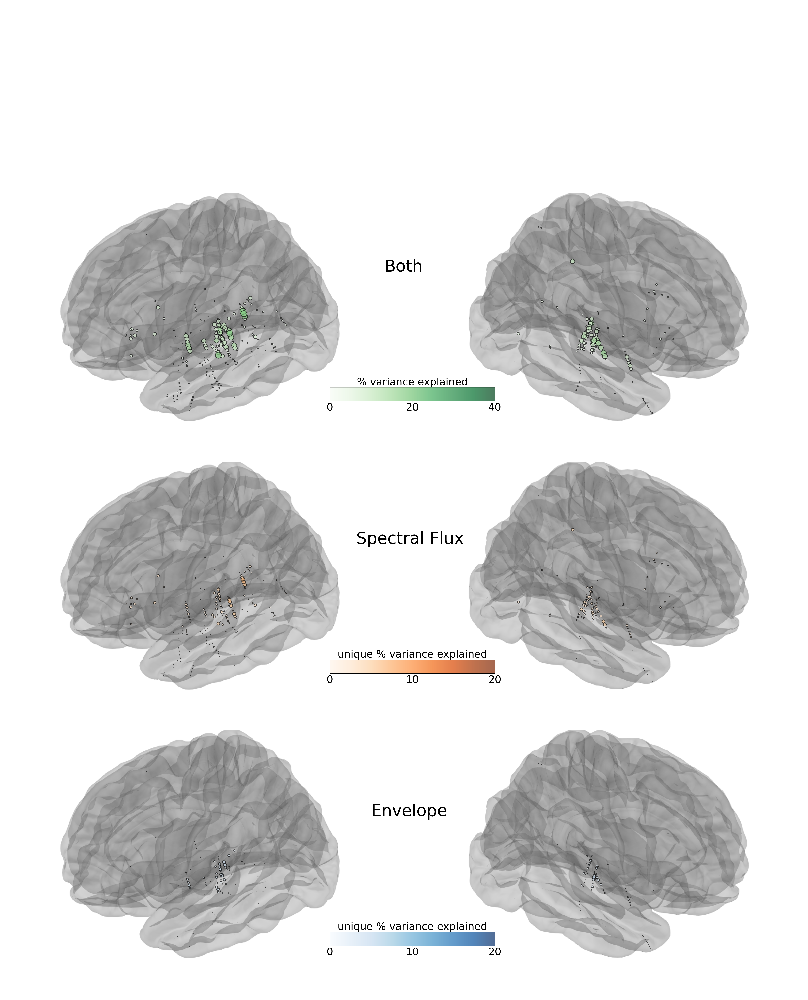

In [26]:
from matplotlib import ticker
for i in ('x','y','z','both','bothminussf','bothminusenv'):
    final_tobrain2[i] = final_tobrain2[i].astype(float)
datas_to_plot = [final_tobrain2["both"].values,final_tobrain2["bothminusenv"].values,final_tobrain2["bothminussf"].values]
ch_names = final_tobrain2['normative_name'].values
loc = final_tobrain2[['x','y','z']].values
# Declare montage
ch_pos = dict(zip(ch_names, loc))
montage = mne.channels.make_dig_montage(ch_pos=ch_pos, coord_frame='head')
info_ = mne.create_info(list(ch_names), 1000., ch_types='seeg').set_montage(montage)


mne.viz.set_3d_backend("notebook")
fig = mne.viz.create_3d_figure(size=(900, 600), bgcolor='white', scene=True)
subjects_dir = "data\\anatomy\\anatomy2\\"
trans =  mne.read_trans(subjects_dir + '\\fsaverage\\fsaverage-trans.fif')
surfaces = {'brain': 1}

fig =plot_alignment(info=info_,trans=trans,subject='fsaverage',subjects_dir=subjects_dir,
                 surfaces=dict(pial=0.4),seeg=True, interaction='terrain',coord_frame='mri',fig=fig)

mne.viz.set_3d_view(fig,azimuth=-180, elevation=-70,distance = 0.32)
xy, im = snapshot_brain_montage(fig, montage)
xy_pts1 = np.vstack([xy[ch] for ch in info_['ch_names']])

mne.viz.set_3d_view(fig,azimuth=180, elevation=70,distance = 0.32)
xy,im2 = snapshot_brain_montage(fig, montage)
xy_pts2 = np.vstack([xy[ch] for ch in info_['ch_names']])


images = [im2,im,im2,im,im2,im]
idxs = [0,0,1,1,2,2]
cmaaps = ['Greens','Greens','Oranges','Oranges', 'Blues','Blues']
fig4, axs = plt.subplots(3,2,figsize=(50, 50))

vmins = [0,0,0,0,0,0]
vmaxs = [40,40,20,20,20,20]


ms = []

for i,(ax,image,idx,cmaap,vmin,vmax) in enumerate(zip(axs.ravel(),images,idxs,cmaaps,vmins,vmaxs)):
    
    
    #vmin=-1; vmax=12

    if (i % 2) == 0:
        ax.imshow(image, aspect='auto') 
        mask = loc[:, 0] < 0 # Data for electrodes in left hemisphere are set to np.nan
        sizes = datas_to_plot[idx][mask]
        sizes=sizes*39
        m = ax.scatter(*xy_pts2[mask].T, c=datas_to_plot[idx][mask], s=sizes, cmap=cmaap, linewidths=2.6, edgecolors='k', alpha=.7, vmin=vmin, vmax=vmax) 
    else:
        ax.imshow(image, aspect='auto')
        mask = loc[:, 0] >0 # Data for electrodes in left hemisphere are set to np.nan
        sizes = datas_to_plot[idx][mask] 
        sizes=sizes*39

        m = ax.scatter(*xy_pts1[mask].T, c=datas_to_plot[idx][mask], s = sizes,cmap=cmaap, linewidths=2.6, edgecolors='k', alpha=.7, vmin=vmin, vmax=vmax) 
        ms.append(m)
    ax.set_axis_off()

cax = fig4.add_axes([0.41, 0.67, 0.2, 0.55])
cax.set_axis_off()
cbar = plt.colorbar(ms[0], ax=cax, orientation='horizontal',aspect=12, pad=0)
#cbar.ax.locator_params(nbins=4)
cbar.ax.tick_params(labelsize=45)
cbar.ax.set_title('% variance explained',fontsize=45);
cax.text(0.33,0.3,'Both',fontsize=72)
cbar.set_ticks([0.,  20, 40])


cax2 = fig4.add_axes([0.41, 0.34, 0.2, 0.55])
cax2.set_axis_off()
cax2.text(0.16,0.3,'Spectral Flux',fontsize=72)

cbar2 = plt.colorbar(ms[1], ax=cax2, orientation='horizontal',aspect=12, pad=0)
cbar2.ax.tick_params(labelsize=45)
cbar2.set_ticks([0.,  10, 20])

cbar2.ax.set_title('unique % variance explained',fontsize=45);

cax3 = fig4.add_axes([0.41, 0.01, 0.2, 0.55])
cax3.set_axis_off()
cax3.text(0.25,0.3,'Envelope',fontsize=72)
cbar3 = plt.colorbar(ms[2], ax=cax3, orientation='horizontal',aspect=12, pad=0)
cbar3.set_ticks([0.,  10, 20])

cbar3.ax.tick_params(labelsize=45)
cbar3.ax.set_title('unique % variance explained',fontsize=45);

plt.tight_layout()
plt.subplots_adjust(hspace=0)


#fig4.savefig("figure6middleright.png",  dpi=300, bbox_inches=None, pad_inches=0.1,  facecolor='white', edgecolor='white' )

In [ ]:
#Load TRF kernels HFa

In [27]:
with open('data\\TRF\\all_patients_TRF_kernels_HFa.pickle', 'rb') as handle:
    kernelbroadband = pickle.load(handle)

In [28]:
allTRFenv = kernelbroadband['kernel_envelope']
allTRFsf = kernelbroadband['kernel_spectralFlux']

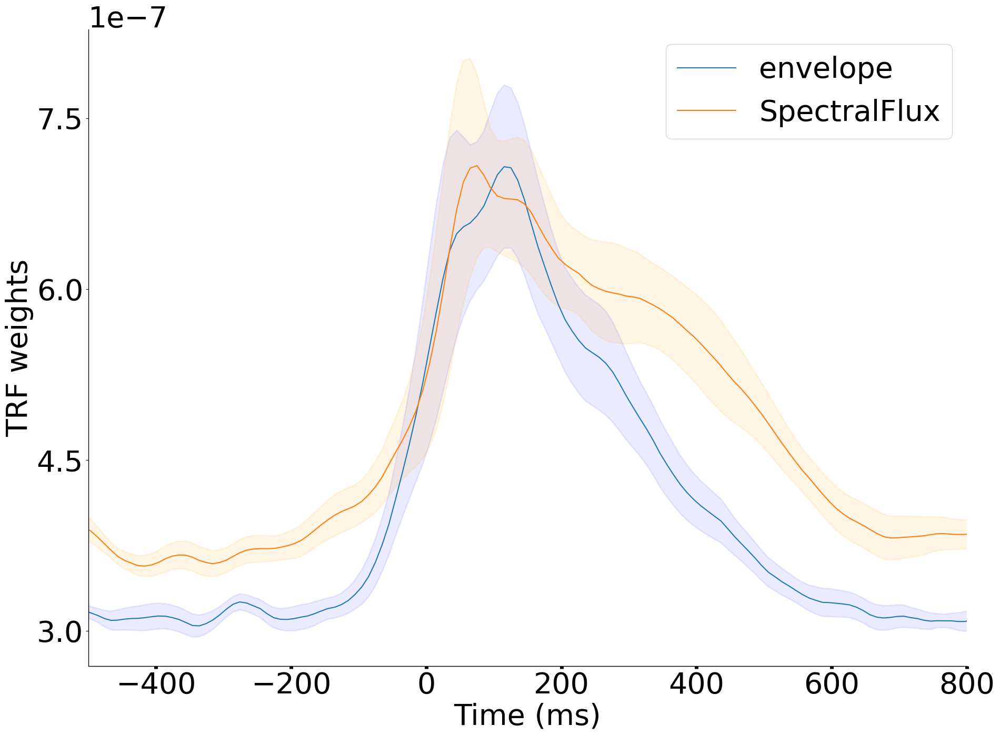

In [32]:
plt.rcParams.update({'axes.linewidth':1})


tidx = np.where(np.logical_and(np.linspace(-2000,2000,400)>=-1000, np.linspace(-2000,2000,400)<=1000))[0]
fig,ax = plt.subplots(1,1, figsize=(20,15))

time = np.linspace(-2000,2000,400)[tidx]
envdat = np.mean(np.mean(allTRFenv,0),0)[tidx]
yerr0 = envdat - stats.sem(np.mean(np.asarray(allTRFenv),0))[tidx]
yerr1 = envdat +  stats.sem(np.mean(np.asarray(allTRFenv),0))[tidx]
sfdat = np.mean(np.mean(allTRFsf,0),0)[tidx]
yerr2 = sfdat - stats.sem(np.mean(np.asarray(allTRFsf),0))[tidx]
yerr3 = sfdat +  stats.sem(np.mean(np.asarray(allTRFsf),0)) [tidx]             



ax.plot(time,envdat,label='envelope')
ax.fill_between(time, yerr0, yerr1, color='blue',alpha=0.08, linewidth=2)
ax.plot(time,sfdat,label='SpectralFlux')
ax.fill_between(time, yerr2, yerr3, color='orange',alpha=0.1, linewidth=2)

ax.xaxis.set_tick_params(width=5)
ax.spines[['right','top']].set_visible(False)
ax.set_xlabel('Time (ms)')
ax.set_ylabel('TRF weights')
ax.set_xlim(-500,800);
ax.yaxis.set_major_locator(plt.MaxNLocator(4))
ax.legend();
plt.tight_layout()

#fig.savefig("figure6bottomleftfinal.png",  dpi=300, format=None, metadata=None,
# bbox_inches=None, pad_inches=0.1,  facecolor='white', edgecolor='white' )
